In [2]:
# Cell 1: 基本ライブラリのインポート

from __future__ import annotations

from dataclasses import dataclass
from pathlib import Path
from typing import Any, Dict, List, Sequence

import json
import subprocess
import tempfile
import shutil
import os

import joblib
import numpy as np
import pandas as pd
import yaml

from sklearn.linear_model import LinearRegression, Ridge
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.model_selection import TimeSeriesSplit, KFold
from sklearn.preprocessing import StandardScaler


In [3]:
# Cell 2: Config クラスの定義（元の src/config.py 相当）

@dataclass
class Config:
    """Dataclass wrapper around a dictionary config."""

    data: Dict[str, Any]
    path: Path

    @classmethod
    def from_yaml(cls, path: str | Path) -> "Config":
        path = Path(path)
        with path.open("r", encoding="utf-8") as f:
            data = yaml.safe_load(f)
        return cls(data=data, path=path)

    def get(self, *keys: str, default: Any | None = None) -> Any:
        node: Any = self.data
        for key in keys:
            if not isinstance(node, dict):
                return default
            node = node.get(key, default)
        return node

    def ensure_dirs(self) -> None:
        """Ensure that runtime directories exist."""
        paths = self.data.get("paths", {})
        for key in ["processed_dir", "models_dir", "submissions_dir", "logs_dir"]:
            value = paths.get(key)
            if value is None:
                continue
            Path(value).mkdir(parents=True, exist_ok=True)

In [4]:
# Cell 3: YAML コンフィグを書き出して読み込む（外部ファイル版）
# すでに config.yml があるなら、このセルはスキップして from_yaml だけ使えばOK

config_text = """
# 実験名
run_name: default

# ランダムシード
seed: 42

# パス設定
paths:
  input_dir: data
  processed_dir: data/processed
  models_dir: models
  submissions_dir: submissions
  logs_dir: logs

files:
  train: train.csv
  test: test.csv

# 目的変数
target:
  column: market_forward_excess_returns

# 交差検証
cv:
  strategy: time_series  # 時系列分割
  n_splits: 5
  time_column: date_id

# 特徴量エンジニアリング
features:
  drop_columns:
    - date_id
    - forward_returns
    - risk_free_rate
    - market_forward_excess_returns
    - lagged_forward_returns
    - lagged_risk_free_rate
    - lagged_market_forward_excess_returns
    - is_scored
  imputation_strategy: median
  scale: true

# モデル
model:
  type: ridge
  params:
    alpha: 1.0
"""

config_path = Path("config.yml")
config_path.write_text(config_text, encoding="utf-8")

config = Config.from_yaml(config_path)
config.ensure_dirs()

config.data  # 中身をざっと確認

{'run_name': 'default',
 'seed': 42,
 'paths': {'input_dir': 'data',
  'processed_dir': 'data/processed',
  'models_dir': 'models',
  'submissions_dir': 'submissions',
  'logs_dir': 'logs'},
 'files': {'train': 'train.csv', 'test': 'test.csv'},
 'target': {'column': 'market_forward_excess_returns'},
 'cv': {'strategy': 'time_series', 'n_splits': 5, 'time_column': 'date_id'},
 'features': {'drop_columns': ['date_id',
   'forward_returns',
   'risk_free_rate',
   'market_forward_excess_returns',
   'lagged_forward_returns',
   'lagged_risk_free_rate',
   'lagged_market_forward_excess_returns',
   'is_scored'],
  'imputation_strategy': 'median',
  'scale': True},
 'model': {'type': 'ridge', 'params': {'alpha': 1.0}}}

In [5]:
# Cell 4: FeatureConfig & SimpleFeatureExtractor（元の src/features.py 相当）

@dataclass
class FeatureConfig:
    drop_columns: Sequence[str]
    imputation_strategy: str = "median"
    scale: bool = True
    rolling_windows: Sequence[int] | None = None
    enable_interactions: bool = True
    time_column: str | None = None
    group_column: str | None = None
    # 追加: クロス特徴量に使うカラムの NaN 割合の上限（例: 0.3 = 30%）
    interaction_max_nan_ratio: float = 0.4

class SimpleFeatureExtractor:
    """Extracts simple statistical features suitable for the HTMP dataset."""

    def __init__(self, config: FeatureConfig):
        self.config = config
        self.scaler: StandardScaler | None = None
        self.numeric_columns: List[str] = []
        self.interaction_columns: List[str] = []      # クロス特徴量に使うカラム

    def _prepare_columns(
        self, df: pd.DataFrame, target_column: str | None, fit: bool
    ) -> List[str]:
        drop_cols = set(self.config.drop_columns)
        if target_column is not None:
            drop_cols.add(target_column)

        if fit or not self.numeric_columns:
            numeric_columns = [
                col
                for col in df.columns
                if col not in drop_cols and pd.api.types.is_numeric_dtype(df[col])
            ]
            if not numeric_columns:
                raise ValueError("No numeric columns available for feature extraction.")
            self.numeric_columns = numeric_columns

            # ★ ここで「交互作用に使うカラム」を NaN 割合でフィルタする
            if self.config.enable_interactions:
                nan_ratio = df[self.numeric_columns].isna().mean()
                max_ratio = self.config.interaction_max_nan_ratio
                self.interaction_columns = [
                    col for col in self.numeric_columns
                    if nan_ratio[col] <= max_ratio
                ]
            else:
                self.interaction_columns = []
                
        numeric_columns = [col for col in self.numeric_columns if col in df.columns]
        if not numeric_columns:
            raise ValueError("Configured numeric columns are missing from the provided dataframe.")
        return numeric_columns

    def fit_transform(self, df: pd.DataFrame, target_column: str | None = None) -> pd.DataFrame:
        return self._create_features(df.copy(), target_column=target_column, fit=True)

    def transform(self, df: pd.DataFrame, target_column: str | None = None) -> pd.DataFrame:
        return self._create_features(df.copy(), target_column=target_column, fit=False)

    def _create_features(
        self,
        df: pd.DataFrame,
        target_column: str | None = None,
        fit: bool = False,
    ) -> pd.DataFrame:
        numeric_columns = self._prepare_columns(df, target_column=target_column, fit=fit)
        df_numeric = df[numeric_columns].copy()

        df_numeric = self._apply_imputation(df_numeric)
        df_numeric = self._add_rolling_statistics(df_numeric, df)
        df_numeric = self._add_interactions(df_numeric)

        if self.config.scale:
            if fit:
                self.scaler = StandardScaler()
                scaled = self.scaler.fit_transform(df_numeric)
            else:
                if self.scaler is None:
                    raise RuntimeError("Scaler has not been fitted. Call fit_transform first.")
                scaled = self.scaler.transform(df_numeric)
            df_numeric = pd.DataFrame(scaled, columns=df_numeric.columns, index=df_numeric.index)

        return df_numeric

    def _apply_imputation(self, df_numeric: pd.DataFrame) -> pd.DataFrame:
        if self.config.imputation_strategy == "mean":
            return df_numeric.fillna(df_numeric.mean())
        if self.config.imputation_strategy == "median":
            return df_numeric.fillna(df_numeric.median())
        return df_numeric.fillna(0.0)

    def _add_rolling_statistics(self, df_numeric: pd.DataFrame, df_original: pd.DataFrame) -> pd.DataFrame:
        windows = self.config.rolling_windows or []
        time_col = self.config.time_column
        group_col = self.config.group_column
        if not windows or time_col is None or time_col not in df_original.columns:
            return df_numeric

        df_with_time = df_original[[time_col]].copy()
        if group_col and group_col in df_original.columns:
            df_with_time[group_col] = df_original[group_column]

        augmented = df_numeric.copy()
        for window in windows:
            suffix = f"_roll{window}"
            if group_col and group_col in df_with_time.columns:
                rolled_parts = []
                for col in df_numeric.columns:
                    rolled = (
                        df_numeric[col]
                        .groupby(df_with_time[group_col])
                        .transform(lambda s: s.rolling(window=window, min_periods=1).mean())
                    )
                    rolled_parts.append(rolled.rename(f"{col}{suffix}"))
                augmented = pd.concat([augmented] + rolled_parts, axis=1)
            else:
                sorter = df_with_time[time_col].argsort()
                df_sorted = df_numeric.iloc[sorter]
                for col in df_numeric.columns:
                    rolled_values = df_sorted[col].rolling(window=window, min_periods=1).mean()
                    augmented.loc[:, f"{col}{suffix}"] = rolled_values.sort_index()
        return augmented

    def _add_interactions(self, df_numeric: pd.DataFrame) -> pd.DataFrame:
        if not self.config.enable_interactions:
            return df_numeric

        # interaction_columns が未設定なら numeric_columns 全部を使うフォールバック
        cols = self.interaction_columns or self.numeric_columns

        # 交互作用に使うカラムが少なすぎる場合はそのまま返す
        if len(cols) < 2:
            return df_numeric

        interaction_cols = {}
        for i, col_a in enumerate(cols):
            for col_b in cols[i + 1:]:
                interaction_cols[f"{col_a}_x_{col_b}"] = df_numeric[col_a] * df_numeric[col_b]

        if interaction_cols:
            df_numeric = pd.concat(
                [df_numeric, pd.DataFrame(interaction_cols, index=df_numeric.index)],
                axis=1,
            )
        return df_numeric

In [6]:
# Cell 5: ModelConfig / create_model / build_cv / rmse（元の src/model.py 相当）

@dataclass
class ModelConfig:
    type: str
    params: Dict[str, Any]
    fit_intercept: bool = True


def create_model(config: ModelConfig):
    if config.type == "ridge":
        return Ridge(**config.params)
    if config.type == "linear_regression":
        return LinearRegression(fit_intercept=config.fit_intercept)
    raise ValueError(f"Unsupported model type: {config.type}")


def build_cv(strategy: str, n_splits: int, shuffle: bool = False, random_state: int | None = None):
    if strategy == "time_series":
        return TimeSeriesSplit(n_splits=n_splits)
    if strategy == "kfold":
        return KFold(n_splits=n_splits, shuffle=shuffle, random_state=random_state)
    raise ValueError(f"Unsupported CV strategy: {strategy}")


def rmse(y_true, y_pred):
    return mean_squared_error(y_true, y_pred, squared=False)

In [7]:
# Cell 6: データ読み込みと簡単な確認

paths = config.get("paths")
files = config.get("files")
target_cfg = config.get("target")
cv_cfg = config.get("cv")
feature_cfg = config.get("features")
model_cfg = config.get("model")

train_path = Path(paths["input_dir"]) / files["train"]
train_df = pd.read_csv(train_path)

print("train shape:", train_df.shape)
display(train_df.head())
display(train_df.describe(include="all").T.head())

print("\nNaN counts (top 20):")
display(train_df.isna().sum().sort_values(ascending=False).head(20))

train shape: (8990, 98)


,date_id,D1,D2,D3,D4,D5,D6,D7,D8,D9,...,V3,V4,V5,V6,V7,V8,V9,forward_returns,risk_free_rate,market_forward_excess_returns
0,0,0,0,0,1,1,0,0,0,1,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-0.002421,0.000301,-0.003038
1,1,0,0,0,1,1,0,0,0,1,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-0.008495,0.000303,-0.009114
2,2,0,0,0,1,0,0,0,0,1,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-0.009624,0.000301,-0.010243
3,3,0,0,0,1,0,0,0,0,0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.004662,0.000299,0.004046
4,4,0,0,0,1,0,0,0,0,0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-0.011686,0.000299,-0.012301


,count,mean,std,min,25%,50%,75%,max
date_id,8990.0,4494.500000,2595.333794,0.0,2247.25,4494.5,6741.75,8989.0
D1,8990.0,0.031591,0.174917,0.0,0.00,0.0,0.00,1.0
D2,8990.0,0.031591,0.174917,0.0,0.00,0.0,0.00,1.0
D3,8990.0,0.047831,0.213420,0.0,0.00,0.0,0.00,1.0
D4,8990.0,0.575195,0.494341,0.0,0.00,1.0,1.00,1.0



NaN counts (top 20):


E7     6969
V10    6049
S3     5733
M1     5547
M13    5540
M14    5540
M6     5043
V9     4539
S12    3537
M5     3283
M2     3217
S8     3009
M3     2018
E1     1784
P6     1638
E20    1616
P7     1616
P5     1574
V5     1512
S5     1511
dtype: int64

Columns with NaNs: 85


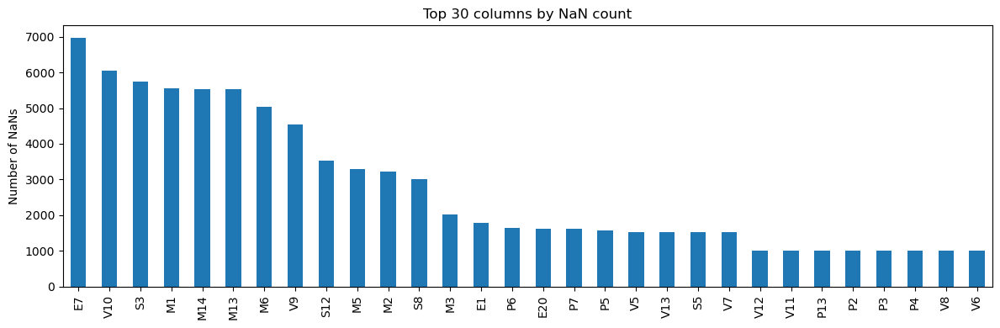

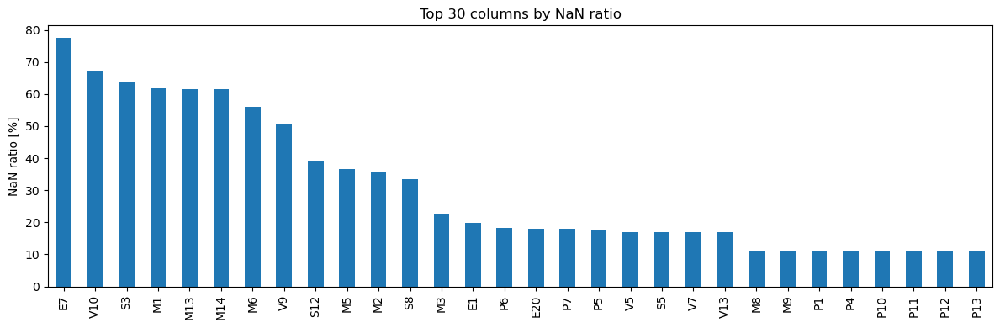

In [8]:
# Cell 6.1: NaN個数の可視化（上位カラム）

import matplotlib.pyplot as plt

# 各列の NaN 個数を計算
nan_counts = train_df.isna().sum()

# 0個の列は除外して、多い順にソート
nan_counts = nan_counts[nan_counts > 0].sort_values(ascending=False)

print("Columns with NaNs:", len(nan_counts))

# 上位 30 列を棒グラフで可視化（列数が少なければそのまま全部表示）
top_k = 30
plt.figure(figsize=(12, 4))
nan_counts.head(top_k).plot(kind="bar")
plt.ylabel("Number of NaNs")
plt.title(f"Top {min(top_k, len(nan_counts))} columns by NaN count")
plt.xticks(rotation=90)
plt.tight_layout()
plt.show()

# NaN 割合の可視化（オプション）

nan_ratio = (train_df.isna().mean() * 100).sort_values(ascending=False)
nan_ratio = nan_ratio[nan_ratio > 0]

plt.figure(figsize=(12, 4))
nan_ratio.head(top_k).plot(kind="bar")
plt.ylabel("NaN ratio [%]")
plt.title(f"Top {min(top_k, len(nan_ratio))} columns by NaN ratio")
plt.xticks(rotation=90)
plt.tight_layout()
plt.show()

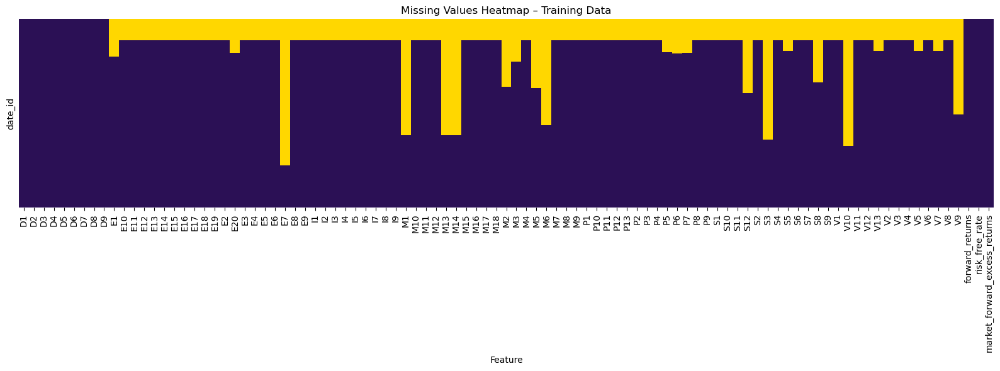

In [9]:
# Cell 6-1-2: Missing Values Heatmap – Training Data

import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
from matplotlib.colors import ListedColormap

# ベースとなる DataFrame（必要に応じて train_df ではなく train_pd を使う）
df_na = train_df.copy()

# date_id でソートして index にすると見やすい
if "date_id" in df_na.columns:
    df_na = df_na.sort_values("date_id").set_index("date_id")

# そのまま全行を描くと重くなる場合があるので、必要なら間引き
# step = 1 のままで全行、例えば 5 行ごとにしたいなら step = 5 に変更
step = 1
df_na_plt = df_na.iloc[::step]

# True(欠損) / False(非欠損) の行列を作成
na_matrix = df_na_plt.isna()

plt.figure(figsize=(16, 6))

# 欠損: 黄色 / 非欠損: 濃い紫 にしたい場合
cmap = ListedColormap(["#2b1055", "#ffd700"])  # [False, True] の順

sns.heatmap(
    na_matrix,
    cmap=cmap,
    cbar=False,          # カラーバー不要なら False
    xticklabels=True,
    yticklabels=False,   # date_id が多い場合はラベルを消す（必要なら True に）
)

plt.title("Missing Values Heatmap – Training Data")
plt.xlabel("Feature")
plt.ylabel("date_id")

# y 軸の目盛りを少しだけ表示したい場合（オプション）
# idx = df_na_plt.index
# tick_step = max(len(idx) // 20, 1)  # おおよそ20個くらい表示
# plt.yticks(
#     np.arange(0.5, len(idx), tick_step),
#     idx[::tick_step],
# )

plt.tight_layout()
plt.show()

In [10]:
# Cell 6.2: NaN を全く含まないカラムのみを選択

# 全カラムのうち、1つも NaN を含まないカラム
no_nan_columns = [
    col for col in train_df.columns
    if not train_df[col].isna().any()
]

print(f"NaN を含まないカラム数: {len(no_nan_columns)} / {train_df.shape[1]}")
print(no_nan_columns)

# もし「NaN なし版の DataFrame」を作りたければこちらも
train_df_no_nan = train_df[no_nan_columns].copy()
display(train_df_no_nan.head())

NaN を含まないカラム数: 13 / 98
['date_id', 'D1', 'D2', 'D3', 'D4', 'D5', 'D6', 'D7', 'D8', 'D9', 'forward_returns', 'risk_free_rate', 'market_forward_excess_returns']


,date_id,D1,D2,D3,D4,D5,D6,D7,D8,D9,forward_returns,risk_free_rate,market_forward_excess_returns
0,0,0,0,0,1,1,0,0,0,1,-0.002421,0.000301,-0.003038
1,1,0,0,0,1,1,0,0,0,1,-0.008495,0.000303,-0.009114
2,2,0,0,0,1,0,0,0,0,1,-0.009624,0.000301,-0.010243
3,3,0,0,0,1,0,0,0,0,0,0.004662,0.000299,0.004046
4,4,0,0,0,1,0,0,0,0,0,-0.011686,0.000299,-0.012301


In [11]:
# Cell 7: 目的変数 y と特徴量 X を作成（特徴量エンジニアリング）

target_column = target_cfg["column"]
if target_column not in train_df.columns:
    raise KeyError(f"Target column '{target_column}' not found in training data.")

y = train_df[target_column].values

feature_config = FeatureConfig(
    drop_columns=feature_cfg.get("drop_columns", []),
    imputation_strategy=feature_cfg.get("imputation_strategy", "median"),
    scale=feature_cfg.get("scale", True),
    rolling_windows=feature_cfg.get("rolling_windows"),
    enable_interactions=feature_cfg.get("enable_interactions", True),
    time_column=cv_cfg.get("time_column"),
    group_column=cv_cfg.get("group_column"),  # 無ければ None
)
extractor = SimpleFeatureExtractor(feature_config)
X = extractor.fit_transform(train_df, target_column=target_column)

print("X shape:", X.shape)
display(X.head())

X shape: (8990, 3749)


,D1,D2,D3,D4,D5,D6,D7,D8,D9,E1,...,V4_x_V5,V4_x_V6,V4_x_V7,V4_x_V8,V5_x_V6,V5_x_V7,V5_x_V8,V6_x_V7,V6_x_V8,V7_x_V8
0,-0.180613,-0.180613,-0.224129,0.859385,2.060350,0.558935,-0.218878,-0.408195,2.446474,-0.067651,...,-0.091294,-0.239196,-0.125147,-0.44365,-0.178326,0.156316,-0.205243,-0.056295,-0.527397,-0.040535
1,-0.180613,-0.180613,-0.224129,0.859385,2.060350,0.558935,-0.218878,-0.408195,2.446474,-0.067651,...,-0.091294,-0.239196,-0.125147,-0.44365,-0.178326,0.156316,-0.205243,-0.056295,-0.527397,-0.040535
2,-0.180613,-0.180613,-0.224129,0.859385,-0.485355,0.558935,-0.218878,-0.408195,2.446474,-0.067651,...,-0.091294,-0.239196,-0.125147,-0.44365,-0.178326,0.156316,-0.205243,-0.056295,-0.527397,-0.040535
3,-0.180613,-0.180613,-0.224129,0.859385,-0.485355,0.558935,-0.218878,-0.408195,-0.408751,-0.067651,...,-0.091294,-0.239196,-0.125147,-0.44365,-0.178326,0.156316,-0.205243,-0.056295,-0.527397,-0.040535
4,-0.180613,-0.180613,-0.224129,0.859385,-0.485355,0.558935,-0.218878,-0.408195,-0.408751,-0.067651,...,-0.091294,-0.239196,-0.125147,-0.44365,-0.178326,0.156316,-0.205243,-0.056295,-0.527397,-0.040535


In [12]:
# Cell 7.1: no_nan データフレームを使って y と X を作成

target_column = target_cfg["column"]

# 念のため target が no_nan データフレームに含まれているか確認
if target_column not in train_df_no_nan.columns:
    raise KeyError(
        f"Target column '{target_column}' is not in train_df_no_nan. "
        "Cell 6.2 で target_column を含めるようにしておいてください。"
    )

# target が NaN の行は学習から除外
train_df_model = train_df_no_nan.dropna(subset=[target_column]).copy()

print("Original train_df shape:", train_df.shape)
print("no_nan df shape (before drop target NaN):", train_df_no_nan.shape)
print("Modeling df shape (after drop target NaN):", train_df_model.shape)

# 目的変数
y = train_df_model[target_column].values

# FeatureConfig を作成
feature_config = FeatureConfig(
    drop_columns=feature_cfg.get("drop_columns", []),
    imputation_strategy=feature_cfg.get("imputation_strategy", "median"),
    scale=feature_cfg.get("scale", True),
    rolling_windows=feature_cfg.get("rolling_windows"),
    enable_interactions=feature_cfg.get("enable_interactions", True),
    time_column=cv_cfg.get("time_column"),
    group_column=cv_cfg.get("group_column"),
)

extractor = SimpleFeatureExtractor(feature_config)

# ★ ここが「学習を no_nan データフレームを用いて行う」ポイント
X = extractor.fit_transform(train_df_model, target_column=target_column)

print("X shape (no_nan features):", X.shape)
display(X.head())

Original train_df shape: (8990, 98)
no_nan df shape (before drop target NaN): (8990, 13)
Modeling df shape (after drop target NaN): (8990, 13)
X shape (no_nan features): (8990, 45)


,D1,D2,D3,D4,D5,D6,D7,D8,D9,D1_x_D2,...,D5_x_D6,D5_x_D7,D5_x_D8,D5_x_D9,D6_x_D7,D6_x_D8,D6_x_D9,D7_x_D8,D7_x_D9,D8_x_D9
0,-0.180613,-0.180613,-0.224129,0.859385,2.060350,0.558935,-0.218878,-0.408195,2.446474,-0.180613,...,0.0,-0.124398,-0.324403,3.078613,0.010547,0.0,0.0,-0.055895,-0.14968,0.0
1,-0.180613,-0.180613,-0.224129,0.859385,2.060350,0.558935,-0.218878,-0.408195,2.446474,-0.180613,...,0.0,-0.124398,-0.324403,3.078613,0.010547,0.0,0.0,-0.055895,-0.14968,0.0
2,-0.180613,-0.180613,-0.224129,0.859385,-0.485355,0.558935,-0.218878,-0.408195,2.446474,-0.180613,...,0.0,-0.124398,-0.324403,-0.324822,0.010547,0.0,0.0,-0.055895,-0.14968,0.0
3,-0.180613,-0.180613,-0.224129,0.859385,-0.485355,0.558935,-0.218878,-0.408195,-0.408751,-0.180613,...,0.0,-0.124398,-0.324403,-0.324822,0.010547,0.0,0.0,-0.055895,-0.14968,0.0
4,-0.180613,-0.180613,-0.224129,0.859385,-0.485355,0.558935,-0.218878,-0.408195,-0.408751,-0.180613,...,0.0,-0.124398,-0.324403,-0.324822,0.010547,0.0,0.0,-0.055895,-0.14968,0.0


In [13]:
# Cell 8: 交差検証の設定

cv_strategy = build_cv(
    strategy=cv_cfg.get("strategy", "time_series"),
    n_splits=cv_cfg.get("n_splits", 5),
    shuffle=cv_cfg.get("strategy") != "time_series",
    random_state=config.get("seed"),
)

model_config = ModelConfig(
    type=model_cfg.get("type", "ridge"),
    params=model_cfg.get("params", {}),
    fit_intercept=model_cfg.get("fit_intercept", True),
)

print(cv_strategy)
print(model_config)

TimeSeriesSplit(gap=0, max_train_size=None, n_splits=5, test_size=None)
ModelConfig(type='ridge', params={'alpha': 1.0}, fit_intercept=True)


In [14]:

# Cell 9: モデル学習（OOF 予測 & CV スコア）

oof_predictions = np.zeros(len(y))

scores: List[float] = []
r2_scores: List[float] = []
sharpe_scores: List[float] = []
adj_sharpe_scores: List[float] = []


def compute_adjusted_sharpe(returns: np.ndarray, periods_per_year: int = 252) -> tuple[float, float]:
    """Compute Sharpe and small-sample adjusted Sharpe (Lo, 2002)."""
    if len(returns) == 0:
        return 0.0, 0.0
    vol = returns.std()
    if vol == 0:
        return 0.0, 0.0
    sharpe = returns.mean() / vol * np.sqrt(periods_per_year)
    adj_sharpe = sharpe * (1 - (1 + sharpe ** 2) / (4 * len(returns)))
    return sharpe, adj_sharpe


for fold, (train_idx, valid_idx) in enumerate(cv_strategy.split(X, y)):
    model = create_model(model_config)
    model.fit(X.iloc[train_idx], y[train_idx])

    preds = model.predict(X.iloc[valid_idx])
    oof_predictions[valid_idx] = preds

    fold_rmse = rmse(y[valid_idx], preds)
    fold_r2 = r2_score(y[valid_idx], preds)

    # 売買方向のみを使った戦略リターンで Sharpe を評価
    strategy_returns = np.sign(preds) * y[valid_idx]
    fold_sharpe, fold_adj_sharpe = compute_adjusted_sharpe(strategy_returns)

    scores.append(fold_rmse)
    r2_scores.append(fold_r2)
    sharpe_scores.append(fold_sharpe)
    adj_sharpe_scores.append(fold_adj_sharpe)

    print(
        f"Fold {fold}: RMSE={fold_rmse:.5f} | R2={fold_r2:.5f} "
        f"| Sharpe={fold_sharpe:.4f} | AdjSharpe={fold_adj_sharpe:.4f}"
    )


overall_rmse = rmse(y, oof_predictions)
overall_r2 = r2_score(y, oof_predictions)

oof_strategy_returns = np.sign(oof_predictions) * y
overall_sharpe, overall_adj_sharpe = compute_adjusted_sharpe(oof_strategy_returns)

print(f"\nOverall OOF RMSE: {overall_rmse:.5f}")
print(f"Overall OOF R2: {overall_r2:.5f}")
print(f"Overall OOF Sharpe / AdjSharpe: {overall_sharpe:.4f} / {overall_adj_sharpe:.4f}")
print("Fold RMSE scores:", scores)
print("Fold R2 scores:", r2_scores)
print("Fold Sharpe scores:", sharpe_scores)
print("Fold AdjSharpe scores:", adj_sharpe_scores)


Fold 0: RMSE=0.01218 | R2=-0.01435 | Sharpe=0.3480 | AdjSharpe=0.3479
Fold 1: RMSE=0.00980 | R2=0.00071 | Sharpe=0.6998 | AdjSharpe=0.6997
Fold 2: RMSE=0.01332 | R2=-0.00124 | Sharpe=0.2769 | AdjSharpe=0.2768
Fold 3: RMSE=0.00828 | R2=-0.02083 | Sharpe=-0.2718 | AdjSharpe=-0.2718
Fold 4: RMSE=0.01140 | R2=-0.00261 | Sharpe=0.0640 | AdjSharpe=0.0640

Overall OOF RMSE: 0.01060
Overall OOF R2: -0.00581
Overall OOF Sharpe / AdjSharpe: 0.2179 / 0.2179
Fold RMSE scores: [0.012176704685397536, 0.009804740506860015, 0.01331573667265549, 0.008281938392600397, 0.011400859249493805]
Fold R2 scores: [-0.014347241764061991, 0.0007058521376571703, -0.0012380348531504382, -0.020826821640606452, -0.002605219011031501]
Fold Sharpe scores: [0.347984747662687, 0.6998355163264277, 0.2768756717492561, -0.27182768715550265, 0.06403967300029252]
Fold AdjSharpe scores: [0.34791964028642725, 0.6996615186992352, 0.276825921916338, -0.27177897001361373, 0.06402894164101275]


/home/aoyama/anaconda3/envs/das24/lib/python3.10/site-packages/sklearn/metrics/_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
/home/aoyama/anaconda3/envs/das24/lib/python3.10/site-packages/sklearn/metrics/_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
/home/aoyama/anaconda3/envs/das24/lib/python3.10/site-packages/sklearn/metrics/_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
/home/aoyama/anaconda3/envs/das24/lib/python3.10/site-packages/sklearn/metrics/_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.

In [15]:
# Cell 9.1: ElasticNet と RandomForest で学習・評価する

from sklearn.linear_model import ElasticNet
from sklearn.ensemble import RandomForestRegressor

# 比較したいモデルを辞書で定義
# （ハイパーパラメータは適宜調整してください）
model_defs = {
    "elasticnet": ElasticNet(
        alpha=0.1,
        l1_ratio=0.5,
        max_iter=1000,
        random_state=config.get("seed"),
    ),
    # "random_forest": RandomForestRegressor(
    #     n_estimators=200,
    #     max_depth=None,
    #     min_samples_leaf=1,
    #     n_jobs=-1,
    #     random_state=config.get("seed"),
    #     oob_score=False,
    # ),
}

results = {}

for name, base_model in model_defs.items():
    print("=" * 50)
    print(f"Training model: {name}")
    oof = np.zeros(len(y))
    scores: list[float] = []

    # cv_strategy は何度でも split を呼び出してOK
    for fold, (train_idx, valid_idx) in enumerate(cv_strategy.split(X, y)):
        # 各 fold ごとに新しいインスタンスを作る
        model = base_model.__class__(**base_model.get_params())

        model.fit(X.iloc[train_idx], y[train_idx])
        preds = model.predict(X.iloc[valid_idx])

        oof[valid_idx] = preds
        fold_score = rmse(y[valid_idx], preds)
        scores.append(fold_score)

        print(f"[{name}] Fold {fold}: RMSE={fold_score:.5f}")

    overall = rmse(y, oof)
    print(f"[{name}] Overall OOF RMSE: {overall:.5f}")
    print(f"[{name}] Fold scores: {scores}")

    results[name] = {
        "oof": oof,
        "scores": scores,
        "oof_rmse": overall,
        "model_params": base_model.get_params(),
    }

# 必要なら結果をざっと確認
results

Training model: elasticnet
[elasticnet] Fold 0: RMSE=0.01209
[elasticnet] Fold 1: RMSE=0.00981
[elasticnet] Fold 2: RMSE=0.01331
[elasticnet] Fold 3: RMSE=0.00820
[elasticnet] Fold 4: RMSE=0.01139
[elasticnet] Overall OOF RMSE: 0.01057
[elasticnet] Fold scores: [0.012090408213100251, 0.009809502259924469, 0.013307517920127127, 0.008198631381050632, 0.011388867221834067]


/home/aoyama/anaconda3/envs/das24/lib/python3.10/site-packages/sklearn/metrics/_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
/home/aoyama/anaconda3/envs/das24/lib/python3.10/site-packages/sklearn/metrics/_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
/home/aoyama/anaconda3/envs/das24/lib/python3.10/site-packages/sklearn/metrics/_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
/home/aoyama/anaconda3/envs/das24/lib/python3.10/site-packages/sklearn/metrics/_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.

{'elasticnet': {'oof': array([0.0000000e+00, 0.0000000e+00, 0.0000000e+00, ..., 8.2430011e-06,
         8.2430011e-06, 8.2430011e-06]),
  'scores': [0.012090408213100251,
   0.009809502259924469,
   0.013307517920127127,
   0.008198631381050632,
   0.011388867221834067],
  'oof_rmse': 0.010567367340376655,
  'model_params': {'alpha': 0.1,
   'copy_X': True,
   'fit_intercept': True,
   'l1_ratio': 0.5,
   'max_iter': 1000,
   'positive': False,
   'precompute': False,
   'random_state': 42,
   'selection': 'cyclic',
   'tol': 0.0001,
   'warm_start': False}}}

In [16]:
# Cell 10: 学習済みモデルの保存 & Kaggle へのアップロード（train.py 相当）

run_name = config.get("run_name", "default")

paths = config.get("paths")
models_dir = Path(paths["models_dir"])
processed_dir = Path(paths["processed_dir"])
models_dir.mkdir(parents=True, exist_ok=True)
processed_dir.mkdir(parents=True, exist_ok=True)

fold_model_paths: List[Path] = []

for fold, (train_idx, valid_idx) in enumerate(cv_strategy.split(X, y)):
    model = create_model(model_config)
    model.fit(X.iloc[train_idx], y[train_idx])

    model_path = models_dir / f"{run_name}_fold_{fold}.pkl"
    joblib.dump(
        {
            "model": model,
            "scaler": extractor.scaler,
            "feature_columns": list(X.columns),
        },
        model_path,
    )
    fold_model_paths.append(model_path)
    print(f"Saved fold {fold} model -> {model_path}")


# 全データで学習した最終モデルも保存（任意で利用）
final_model = create_model(model_config)
final_model.fit(X, y)

final_model_path = models_dir / f"{run_name}_final.pkl"
joblib.dump(
    {
        "model": final_model,
        "scaler": extractor.scaler,
        "feature_columns": list(X.columns),
    },
    final_model_path,
)

metadata = {
    "run_name": run_name,
    "scores": scores,
    "r2_scores": r2_scores,
    "sharpe_scores": sharpe_scores,
    "adj_sharpe_scores": adj_sharpe_scores,
    "oof_rmse": overall_rmse,
    "oof_r2": overall_r2,
    "oof_sharpe": overall_sharpe,
    "oof_adj_sharpe": overall_adj_sharpe,
    "feature_columns": list(X.columns),
    "config_path": str(config.path),
}
metadata_path = models_dir / f"{run_name}_metadata.json"
with metadata_path.open("w", encoding="utf-8") as f:
    json.dump(metadata, f, indent=2)

oof_path = processed_dir / f"{run_name}_oof.csv"
pd.DataFrame({"oof_pred": oof_predictions}).to_csv(oof_path, index=False)

print("Saved artifacts:")
print(" - fold models:", fold_model_paths)
print(" - final model:", final_model_path)
print(" - metadata:", metadata_path)
print(" - oof:", oof_path)


# Kaggle Dataset へのアップロード（upload_kaggle_dataset.py のロジックをそのまま移植）
def upload_to_kaggle_dataset(
    dataset_id: str,
    dirs: list[str],
    update: bool = True,
    message: str = "Updated dataset",
    username: str | None = None,
) -> None:
    # ユーザー名解決（~/.kaggle/kaggle.json を利用）
    if username is None:
        kaggle_json_path = Path.home() / ".kaggle" / "kaggle.json"
        if kaggle_json_path.exists():
            with kaggle_json_path.open("r", encoding="utf-8") as f:
                kaggle_config = json.load(f)
                username = kaggle_config.get("username")
        if username is None:
            raise ValueError(
                "Could not determine Kaggle username. Set username or ensure ~/.kaggle/kaggle.json exists."
            )

    kaggle_exe = shutil.which("kaggle")
    if kaggle_exe is None:
        raise FileNotFoundError("kaggle CLI not found. Install with `pip install kaggle` and ensure it is on PATH.")

    temp_dir = tempfile.mkdtemp(prefix="kaggle_upload_")
    print(f"Temporary directory created at: {temp_dir}")

    try:
        # 指定ディレクトリをコピー
        for dir_path in dirs:
            if not os.path.isdir(dir_path):
                raise FileNotFoundError(f"Directory {dir_path} does not exist.")
            dest_dir = os.path.join(temp_dir, os.path.basename(os.path.normpath(dir_path)))
            print(f"Copying {dir_path} to {dest_dir}")
            shutil.copytree(dir_path, dest_dir)

        # kaggle metadata init
        cmd = [kaggle_exe, "datasets", "init", "-p", temp_dir]
        print("Running command:", " ".join(cmd))
        subprocess.run(cmd, check=True)

        metadata_path = os.path.join(temp_dir, "dataset-metadata.json")
        with open(metadata_path, "r", encoding="utf-8") as f:
            metadata = json.load(f)

        metadata["title"] = dataset_id.replace("-", " ").title()
        metadata["id"] = f"{username}/{dataset_id}"
        metadata["licenses"] = [{"name": "CC0-1.0"}]
        metadata["keywords"] = ["finance", "machine-learning", "time-series", "hull-tactical"]

        with open(metadata_path, "w", encoding="utf-8") as f:
            json.dump(metadata, f, indent=2)

        print("Metadata updated:")
        print(json.dumps(metadata, indent=2))

        if update:
            cmd = [kaggle_exe, "datasets", "version", "-p", temp_dir, "-m", message, "-r", "zip"]
            print("Updating existing dataset...")
        else:
            cmd = [kaggle_exe, "datasets", "create", "-p", temp_dir, "-r", "zip"]
            print("Creating new dataset...")

        print("Running command:", " ".join(cmd))

        env = os.environ.copy()
        tmpdir = os.path.expanduser("~/tmp")
        env["TMPDIR"] = tmpdir
        os.makedirs(tmpdir, exist_ok=True)

        subprocess.run(cmd, check=True, env=env)

        print("✅ Dataset uploaded successfully!")
        print(f"Dataset URL: https://www.kaggle.com/datasets/{username}/{dataset_id}")
        print("To use in Kaggle Notebook, add this dataset:")
        print(f"  {username}/{dataset_id}")

    finally:
        if os.path.exists(temp_dir):
            shutil.rmtree(temp_dir)
            print(f"Temporary directory cleaned up: {temp_dir}")


UPLOAD_TO_KAGGLE = True  # True にするとアップロード実行
if UPLOAD_TO_KAGGLE:
    upload_to_kaggle_dataset(
        dataset_id="htmp-baseline-models",
        dirs=["models", "src"],
        update=True,
        message=f"Update from EDA run_name={run_name}",
        username=None,
    )


Saved fold 0 model -> models/None_fold_0.pkl
Saved fold 1 model -> models/None_fold_1.pkl
Saved fold 2 model -> models/None_fold_2.pkl
Saved fold 3 model -> models/None_fold_3.pkl
Saved fold 4 model -> models/None_fold_4.pkl
Saved artifacts:
 - fold models: [PosixPath('models/None_fold_0.pkl'), PosixPath('models/None_fold_1.pkl'), PosixPath('models/None_fold_2.pkl'), PosixPath('models/None_fold_3.pkl'), PosixPath('models/None_fold_4.pkl')]
 - final model: models/None_final.pkl
 - metadata: models/None_metadata.json
 - oof: data/processed/None_oof.csv
Temporary directory created at: /tmp/kaggle_upload_j8uxlhax
Copying models to /tmp/kaggle_upload_j8uxlhax/models
Copying src to /tmp/kaggle_upload_j8uxlhax/src
Running command: /home/aoyama/anaconda3/envs/das24/bin/kaggle datasets init -p /tmp/kaggle_upload_j8uxlhax
Data package template written to: /tmp/kaggle_upload_j8uxlhax/dataset-metadata.json
Metadata updated:
{
  "title": "Htmp Baseline Models",
  "id": "tarowakayama/htmp-baseline-m

100%|██████████| 17.4k/17.4k [00:00<00:00, 20.2kB/s]


Upload successful: src.zip (17KB)
Starting upload for file models.zip


100%|██████████| 930k/930k [00:01<00:00, 661kB/s]


Upload successful: models.zip (930KB)
The following are not valid tags and could not be added to the dataset: ['machine-learning', 'time-series', 'hull-tactical']
✅ Dataset uploaded successfully!
Dataset URL: https://www.kaggle.com/datasets/tarowakayama/htmp-baseline-models
To use in Kaggle Notebook, add this dataset:
  tarowakayama/htmp-baseline-models
Temporary directory cleaned up: /tmp/kaggle_upload_j8uxlhax


In [17]:
# Cell V0: 可視化用に pandas DataFrame に変換
train_pd = pd.read_csv(train_path)

print(train_pd.shape)
train_pd.head(50)

(8990, 98)


,date_id,D1,D2,D3,D4,D5,D6,D7,D8,D9,...,V3,V4,V5,V6,V7,V8,V9,forward_returns,risk_free_rate,market_forward_excess_returns
0,0,0,0,0,1,1,0,0,0,1,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-0.002421,0.000301,-0.003038
1,1,0,0,0,1,1,0,0,0,1,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-0.008495,0.000303,-0.009114
2,2,0,0,0,1,0,0,0,0,1,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-0.009624,0.000301,-0.010243
3,3,0,0,0,1,0,0,0,0,0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.004662,0.000299,0.004046
4,4,0,0,0,1,0,0,0,0,0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-0.011686,0.000299,-0.012301
5,5,0,0,0,1,0,0,0,0,0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-0.006449,0.000300,-0.007066
6,6,0,0,0,1,0,0,0,0,0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.003644,0.000298,0.003029
7,7,0,0,0,1,0,0,0,0,0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-0.024566,0.000300,-0.025183
8,8,0,0,0,1,0,0,0,0,0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-0.008492,0.000298,-0.009105
9,9,0,0,0,1,0,0,0,0,0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.011263,0.000298,0.010649


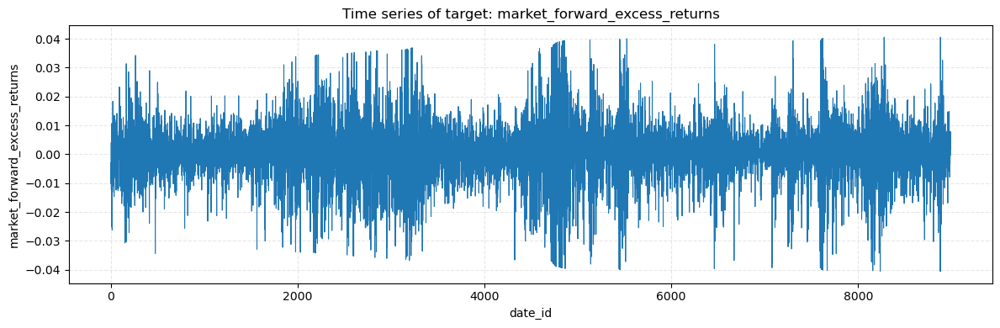

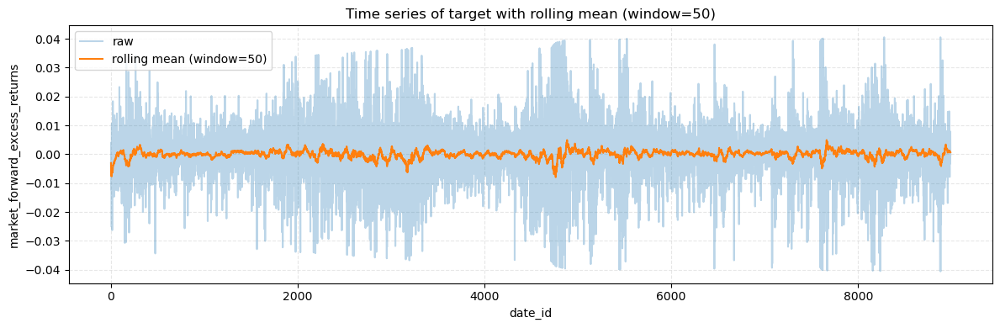

In [18]:
# Cell V1: 目的変数の時系列プロット

# 例: 事前にどこかで target_column を定義している想定
# target_column = target_cfg["column"]  # 例
# 直書きするなら↓のように列名を書く
# target_column = "market_forward_excess_returns"

if target_column not in train_pd.columns:
    raise KeyError(f"target_column '{target_column}' が train_pd に存在しません。")

# 日付 / 時系列の並び替え（date_id があればそれでソート）
if "date_id" in train_pd.columns:
    train_pd = train_pd.sort_values("date_id").reset_index(drop=True)
    x = train_pd["date_id"]
    x_label = "date_id"
else:
    # なければ行番号ベースの擬似時系列
    train_pd = train_pd.reset_index(drop=True)
    x = train_pd.index
    x_label = "index"

plt.figure(figsize=(12, 4))
plt.plot(x, train_pd[target_column], linewidth=0.8)
plt.xlabel(x_label)
plt.ylabel(target_column)
plt.title(f"Time series of target: {target_column}")
plt.grid(True, linestyle="--", alpha=0.3)
plt.tight_layout()
plt.show()

# ノイズが大きい場合のために、移動平均も一緒に見たいとき
window = 50  # お好みで
plt.figure(figsize=(12, 4))
plt.plot(x, train_pd[target_column], alpha=0.3, label="raw")
plt.plot(x, train_pd[target_column].rolling(window=window, min_periods=1).mean(),
         linewidth=1.5, label=f"rolling mean (window={window})")
plt.xlabel(x_label)
plt.ylabel(target_column)
plt.title(f"Time series of target with rolling mean (window={window})")
plt.legend()
plt.grid(True, linestyle="--", alpha=0.3)
plt.tight_layout()
plt.show()

In [19]:
# Cell V1.1: 他の特徴量の時系列プロット（Plotly版・標準化＋カテゴリ平均も表示）

import numpy as np
import plotly.express as px

# 数値カラムだけ抽出
numeric_cols = train_pd.select_dtypes(include="number").columns.tolist()

# date_id と target は除外
feature_cols = [
    c for c in numeric_cols
    if c not in ("date_id", target_column)
]

print("数値カラム候補数:", len(feature_cols))

# --- ① プレフィックスごとに列をグルーピング ---

prefix_groups = {
    "M":   [],
    "E":   [],
    "I":   [],
    "P":   [],
    "V":   [],
    "S":   [],
    "MOM": [],
}

for col in feature_cols:
    if col.startswith("MOM"):
        prefix_groups["MOM"].append(col)
    elif col.startswith("M"):
        prefix_groups["M"].append(col)
    elif col.startswith("E"):
        prefix_groups["E"].append(col)
    elif col.startswith("I"):
        prefix_groups["I"].append(col)
    elif col.startswith("P"):
        prefix_groups["P"].append(col)
    elif col.startswith("V"):
        prefix_groups["V"].append(col)
    elif col.startswith("S"):
        prefix_groups["S"].append(col)

print("プレフィックスごとの列数:")
for k, v in prefix_groups.items():
    print(f"  {k}: {len(v)}")

# --- ② 個別に表示する元の特徴量（あなたの元コードと同じロジック） ---

# ここは任意のオフセットをかけてサブセットを取っている
cols_for_ts = feature_cols.copy()

max_plot_cols = 10
cols_for_ts = cols_for_ts[9:]          # 例: 最初の9を飛ばして10個見る
plot_cols = cols_for_ts[:max_plot_cols]

if not plot_cols:
    raise ValueError("時系列プロット用の数値カラムが見つかりません。")

print("個別にプロットするカラム:", plot_cols)

# --- ③ x 軸に使う列（date_id があればそれ、無ければ index） ---

if "date_id" in train_pd.columns:
    x_col = "date_id"
    df_plot = train_pd[[x_col] + plot_cols].copy()
else:
    x_col = "index"
    df_plot = train_pd[plot_cols].copy()
    df_plot[x_col] = np.arange(len(df_plot))

# --- ④ 各プレフィックスの「平均特徴量」を追加 ---

aggregated_cols = []  # 後でプロット対象に追加するために名前を保持

for prefix, cols in prefix_groups.items():
    if not cols:
        continue  # このプレフィックスのカラムがなければスキップ

    agg_name = f"{prefix}_mean"
    # 行方向の平均を NaN をスキップして計算
    df_plot[agg_name] = train_pd[cols].mean(axis=1, skipna=True)
    aggregated_cols.append(agg_name)

print("追加された集約特徴量カラム:", aggregated_cols)

# 個別カラム＋集約カラムをまとめてプロット対象に
plot_cols_all = plot_cols + aggregated_cols

# --- ⑤ 各カラムを標準化（平均0, 分散1）してプロットしやすく ---

for c in plot_cols_all:
    mean = df_plot[c].mean()
    std = df_plot[c].std(ddof=0)
    if std == 0 or np.isnan(std):
        # 定数列などは平均0にするだけ
        df_plot[c] = df_plot[c] - mean
    else:
        df_plot[c] = (df_plot[c] - mean) / std

# --- ⑥ 長い形式に変形して Plotly でラインプロット ---

df_long = df_plot.melt(
    id_vars=[x_col],
    value_vars=plot_cols_all,
    var_name="feature",
    value_name="value",
)

fig = px.line(
    df_long,
    x=x_col,
    y="value",
    color="feature",
    title="Time series of selected standardized features + group means (interactive)",
)

# 見やすく調整
fig.update_layout(
    hovermode="x unified",
    legend=dict(
        orientation="h",
        yanchor="bottom",
        y=1.02,
        xanchor="right",
        x=1.0,
    ),
)
fig.update_xaxes(rangeslider_visible=True)

fig.show()

数値カラム候補数: 96
プレフィックスごとの列数:
  M: 18
  E: 20
  I: 9
  P: 13
  V: 13
  S: 12
  MOM: 0
個別にプロットするカラム: ['E1', 'E10', 'E11', 'E12', 'E13', 'E14', 'E15', 'E16', 'E17', 'E18']
追加された集約特徴量カラム: ['M_mean', 'E_mean', 'I_mean', 'P_mean', 'V_mean', 'S_mean']


NaN 割合 <= 30% の数値カラム数: 86
相関ヒートマップに使うカラム数: 25
['date_id', 'D1', 'D2', 'D3', 'D4', 'D5', 'D6', 'D7', 'D8', 'D9', 'E1', 'E10', 'E11', 'E12', 'E13', 'E14', 'E15', 'E16', 'E17', 'E18', 'E19', 'E2', 'E20', 'E3', 'E4']


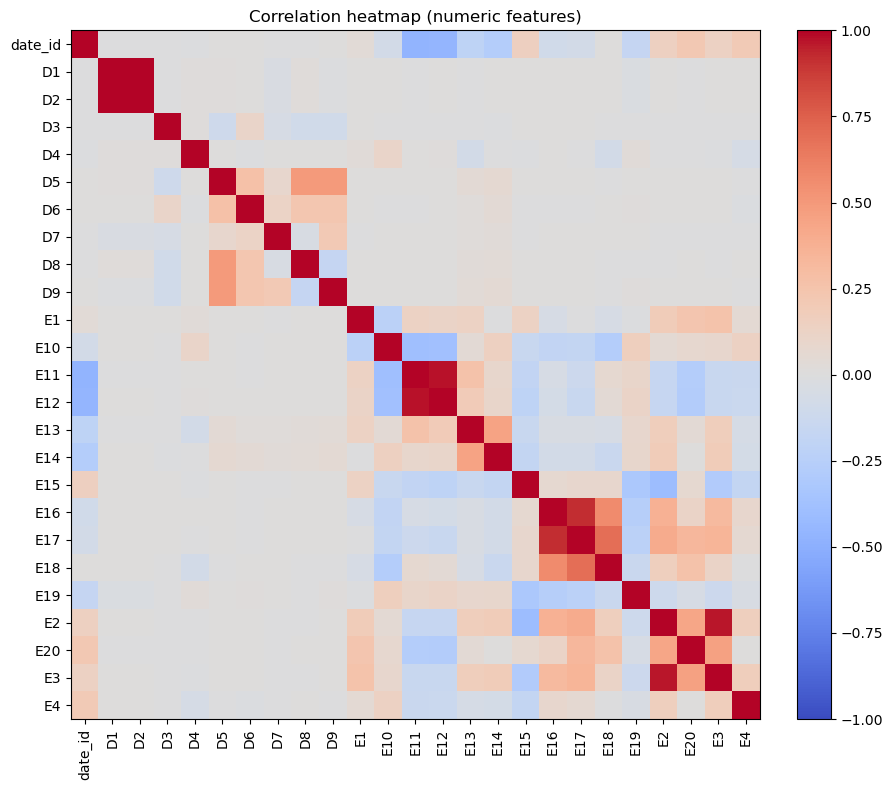

In [20]:
# Cell V2: 相関ヒートマップ（数値カラム）

# 数値カラムだけに限定
numeric_cols = train_pd.select_dtypes(include="number").columns.tolist()

# NaN が多すぎる列は除外（例: 70%以上 NaN の列を落とす）
nan_ratio = train_pd[numeric_cols].isna().mean()
cols_low_nan = nan_ratio[nan_ratio <= 0.3].index.tolist()  # 70%以上データが入っている列

print("NaN 割合 <= 30% の数値カラム数:", len(cols_low_nan))

# 規模が大きすぎないように、上位 N 列に制限
max_corr_cols = 25  # お好みで
corr_cols = cols_low_nan[:max_corr_cols]

print("相関ヒートマップに使うカラム数:", len(corr_cols))
print(corr_cols)

# 相関行列を計算（欠損は行単位で落とす）
corr_df = train_pd[corr_cols].dropna().corr()

plt.figure(figsize=(10, 8))
im = plt.imshow(corr_df.values, vmin=-1, vmax=1, cmap="coolwarm")

plt.colorbar(im, fraction=0.046, pad=0.04)
plt.xticks(range(len(corr_cols)), corr_cols, rotation=90)
plt.yticks(range(len(corr_cols)), corr_cols)
plt.title("Correlation heatmap (numeric features)")
plt.tight_layout()
plt.show()

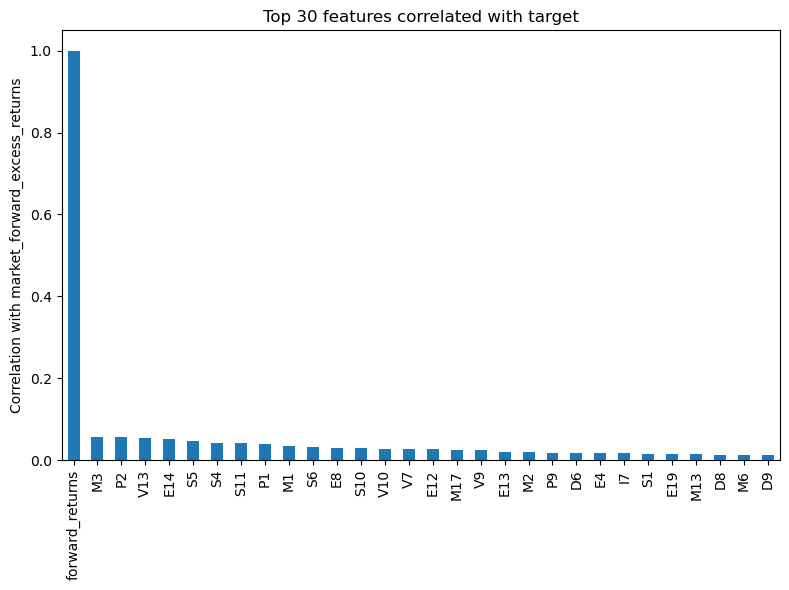

In [21]:
# Cell V2.1 (任意): 目的変数との相関ランキング

if target_column not in train_pd.columns:
    raise KeyError(f"target_column '{target_column}' が train_pd に存在しません。")

# 数値カラムから target と date_id を外す
numeric_cols = train_pd.select_dtypes(include="number").columns.tolist()
feature_cols = [
    c for c in numeric_cols
    if c not in ("date_id", target_column)
]

corr_with_target = (
    train_pd[feature_cols + [target_column]]
    .dropna()
    .corr()[target_column]
    .drop(target_column)
    .sort_values(ascending=False)
)

top_k = 30
plt.figure(figsize=(8, 6))
corr_with_target.head(top_k).plot(kind="bar")
plt.ylabel(f"Correlation with {target_column}")
plt.title(f"Top {min(top_k, len(corr_with_target))} features correlated with target")
plt.xticks(rotation=90)
plt.tight_layout()
plt.show()

In [22]:

# Cell V3: 追加EDA – 特徴量グループ別の概要と欠損率

# 再読み込みしてこのセル単体でも動くようにする
train_path = Path(config.get("paths")["input_dir"]) / config.get("files")["train"]
eda_df = pd.read_csv(train_path)

prefix_info = {
    "M": "Market Dynamics / Technical",
    "E": "Macro Economic",
    "I": "Interest Rate",
    "P": "Price / Valuation",
    "V": "Volatility",
    "S": "Sentiment",
    "MOM": "Momentum",
    "D": "Dummy / Binary",
}

def summarize_by_prefix(df: pd.DataFrame, mapping: dict[str, str]) -> pd.DataFrame:
    rows = []
    for prefix, desc in mapping.items():
        cols = [c for c in df.columns if c.startswith(prefix)]
        if not cols:
            continue
        miss_ratio = df[cols].isna().mean().mean()
        rows.append(
            {
                "prefix": prefix,
                "description": desc,
                "n_cols": len(cols),
                "mean_missing_ratio": miss_ratio,
                "mean_non_missing_ratio": 1 - miss_ratio,
            }
        )
    return pd.DataFrame(rows).sort_values("prefix").reset_index(drop=True)

prefix_summary = summarize_by_prefix(eda_df, prefix_info)
display(prefix_summary)

# 主要なターゲット/ラグ列の統計要約
target_cols = [
    "forward_returns",
    "risk_free_rate",
    "market_forward_excess_returns",
    "lagged_forward_returns",
    "lagged_risk_free_rate",
    "lagged_market_forward_excess_returns",
]
target_cols = [c for c in target_cols if c in eda_df.columns]
if target_cols:
    display(eda_df[target_cols].describe(percentiles=[0.01, 0.05, 0.95, 0.99]).T)

# 期間カバレッジと欠損の推移（date_id が存在する場合のみ）
if "date_id" in eda_df.columns:
    coverage = {
        "min_date_id": eda_df["date_id"].min(),
        "max_date_id": eda_df["date_id"].max(),
        "n_unique_date_id": eda_df["date_id"].nunique(),
    }
    print("Date coverage:", coverage)

    # ざっくり欠損率の時間推移（上位10サンプル）
    miss_by_date = eda_df.groupby("date_id").apply(lambda df: df.isna().mean().mean())
    miss_by_date = miss_by_date.sort_index()
    display(
        miss_by_date.rename("mean_missing_ratio").to_frame().head(10)
    )
    display(
        miss_by_date.rename("mean_missing_ratio").to_frame().tail(10)
    )


,prefix,description,n_cols,mean_missing_ratio,mean_non_missing_ratio
0,D,Dummy / Binary,9,0.000000,1.000000
1,E,Macro Economic,20,0.152786,0.847214
2,I,Interest Rate,9,0.111902,0.888098
3,M,Market Dynamics / Technical,18,0.254938,0.745062
4,P,Price / Valuation,13,0.127389,0.872611
5,S,Sentiment,12,0.202429,0.797571
6,V,Volatility,13,0.198254,0.801746


,count,mean,std,min,1%,5%,50%,95%,99%,max
forward_returns,8990.0,0.000469,0.010551,-0.039754,-3.167309e-02,-1.772558e-02,0.000659,0.016813,0.031505,0.040661
risk_free_rate,8990.0,0.000107,0.000088,-0.000004,1.984127e-07,5.952381e-07,0.000095,0.000229,0.000306,0.000317
market_forward_excess_returns,8990.0,0.000051,0.010568,-0.040582,-3.207196e-02,-1.808736e-02,0.000252,0.016440,0.031148,0.040551


Date coverage: {'min_date_id': 0, 'max_date_id': 8989, 'n_unique_date_id': 8990}


/tmp/ipykernel_197713/2095114875.py:62: DeprecationWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.



,mean_missing_ratio
date_id,
0,0.867347
1,0.867347
2,0.867347
3,0.867347
4,0.867347
5,0.867347
6,0.867347
7,0.867347
8,0.867347


,mean_missing_ratio
date_id,
8980,0.0
8981,0.0
8982,0.0
8983,0.0
8984,0.0
8985,0.0
8986,0.0
8987,0.0
8988,0.0
